1,prepare data

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas
import math
from keras.models import Sequential
from keras.layers import Dense
from keras.layers import LSTM
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import pandas as pd
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
import numpy
import time

Using TensorFlow backend.


In [2]:
def preparedata_steps(steps):
    df=pd.read_csv('SP500_new.csv', engine='python', skipfooter=1)
    #data=df.drop(['Date'], axis = 1)
    data=df.drop(['Date', 'Adj Close','Volume'], axis = 1)
    # normalize the dataset
    scaler_dataset = MinMaxScaler(feature_range=(0, 1))
    dataset = scaler_dataset.fit_transform(data)
    
    target=df['Adj Close']
    # normalize the dataset
    scaler_target = MinMaxScaler(feature_range=(0, 1))
    target = scaler_target.fit_transform(target)
    
    result = []
    for index in range(len(dataset) - steps): # maxmimum date = lastest date - sequence length
            result.append(dataset[index: index + steps]) # index : index + steps
            
    result = np.array(result)
    
    features=result[:]
    target=target[steps:]
    
    trainX=features[:-500]
    testX=features[-500:]
    trainY=target[:-500]
    testY=target[-500:]
    return trainX,trainY,testX,testY,scaler_dataset,scaler_target

4.3,tune time steps:how many days of features are used

In [3]:
repeats=5
steps=[2,3,5,7,10,13,15,17,20,23,25,27,30]
#steps=[2,3]

C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


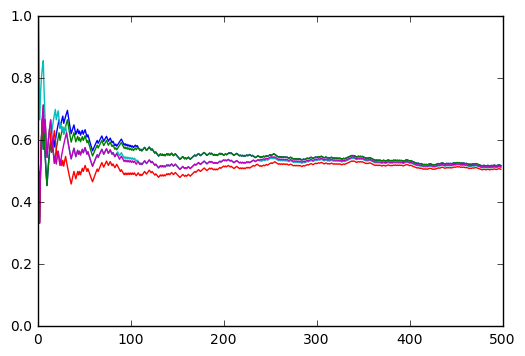

adjclose plot


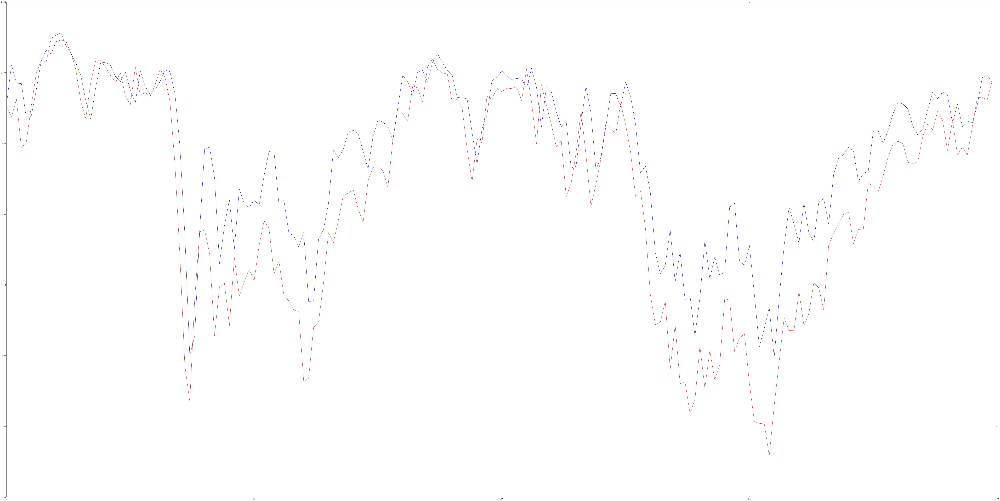

mean of test_RMSE
85.7054592063
std of test_RMSE
17.7323861756
mean of test_r2Score
0.653903013946
std of test_r2Score
0.153038424987
mean of accuracy_all
0.538527023481
std of accuracy_all
0.014260175135
mean of accuracy_30
0.625806451613
std of accuracy_30
0.0437569676331


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


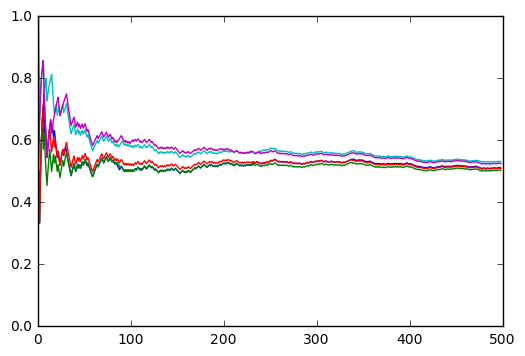

adjclose plot


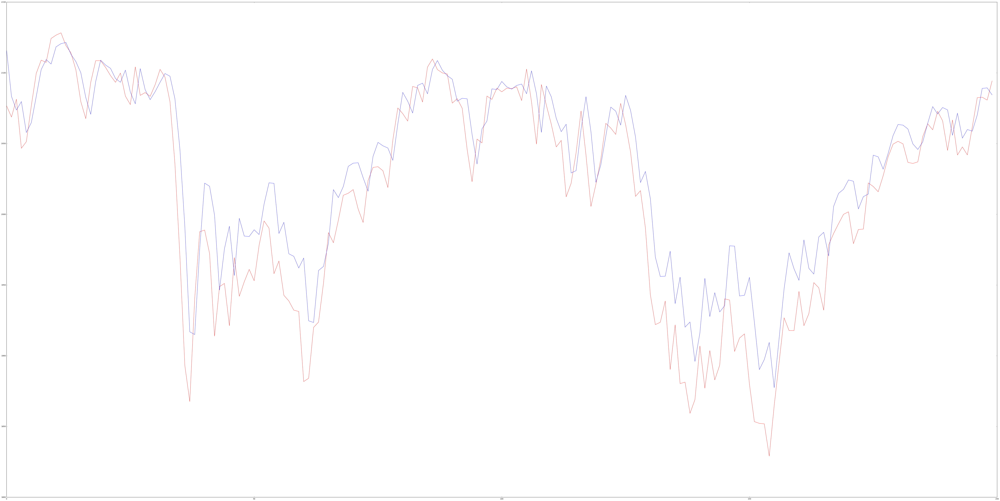

mean of test_RMSE
74.0975185964
std of test_RMSE
16.9190143523
mean of test_r2Score
0.73899053174
std of test_r2Score
0.112157294072
mean of accuracy_all
0.542190793847
std of accuracy_all
0.0255813325353
mean of accuracy_30
0.632258064516
std of accuracy_30
0.0779551353135


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


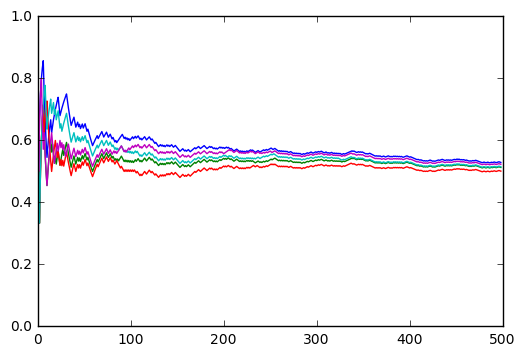

adjclose plot


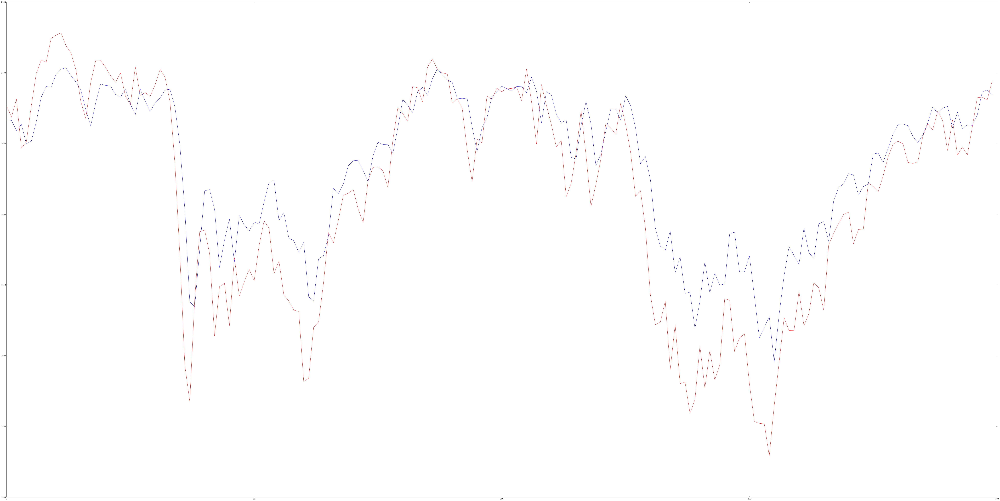

mean of test_RMSE
60.249739254
std of test_RMSE
10.2653367947
mean of test_r2Score
0.831222375245
std of test_r2Score
0.0570761872471
mean of accuracy_all
0.54469826234
std of accuracy_all
0.021788739525
mean of accuracy_30
0.61935483871
std of accuracy_30
0.0774193548387


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


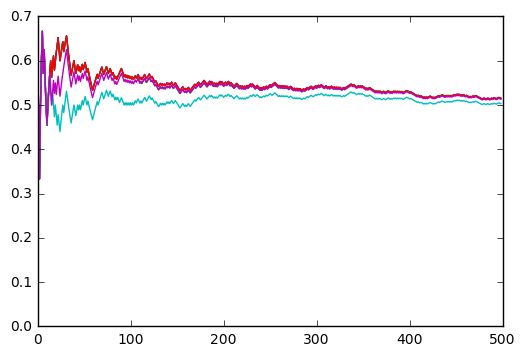

adjclose plot


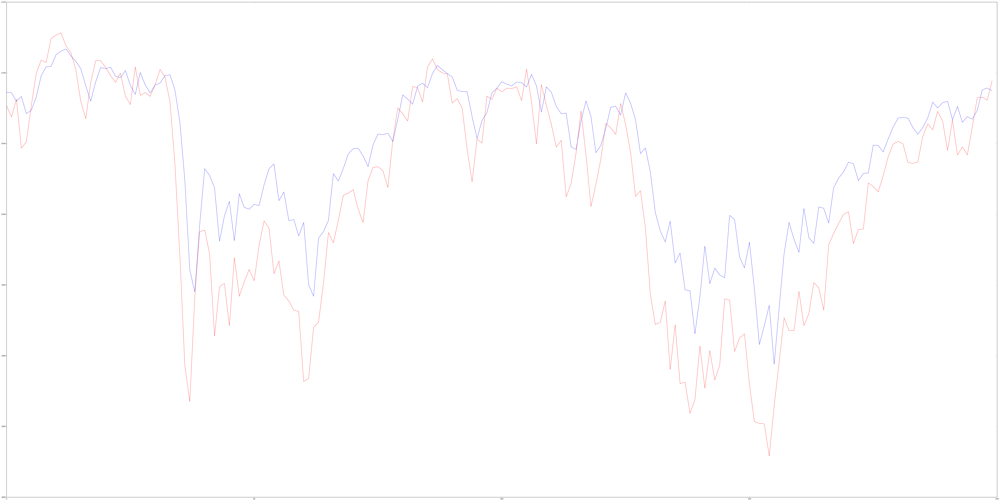

mean of test_RMSE
86.4161177596
std of test_RMSE
9.82340388485
mean of test_r2Score
0.658223365743
std of test_r2Score
0.0734468002125
mean of accuracy_all
0.535352549248
std of accuracy_all
0.0126402988784
mean of accuracy_30
0.612903225806
std of accuracy_30
0.0499739786607


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


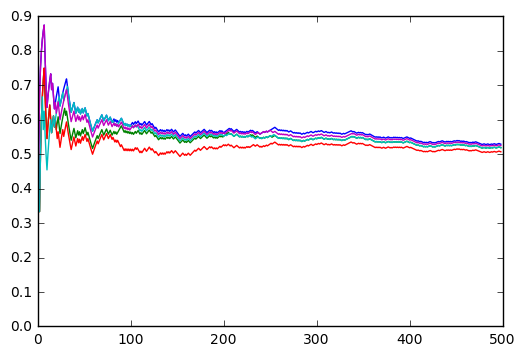

adjclose plot


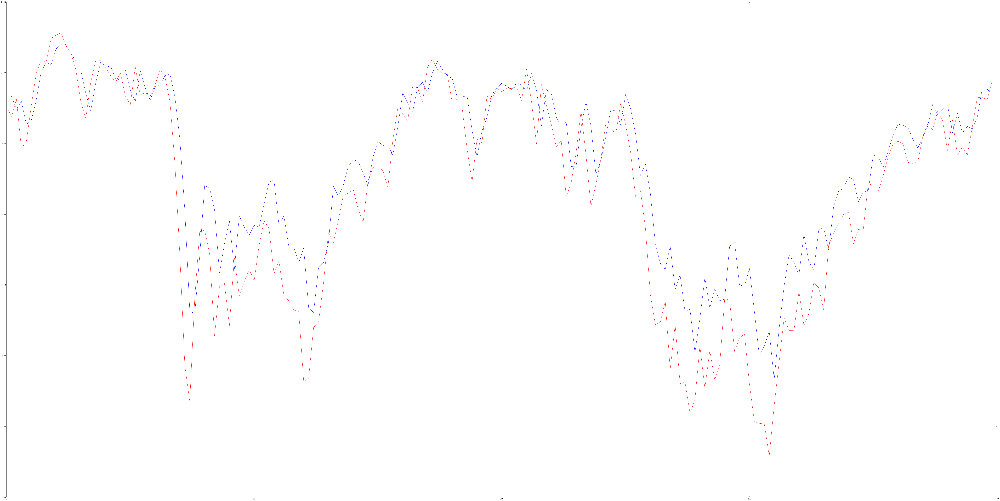

mean of test_RMSE
79.394524943
std of test_RMSE
16.742262856
mean of test_r2Score
0.702523247661
std of test_r2Score
0.108483462613
mean of accuracy_all
0.551687601944
std of accuracy_all
0.0169199619378
mean of accuracy_30
0.651612903226
std of accuracy_30
0.0474094788926


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


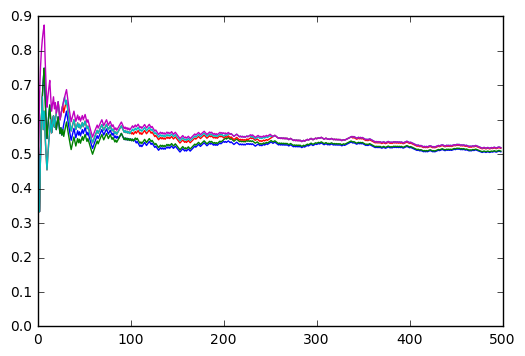

adjclose plot


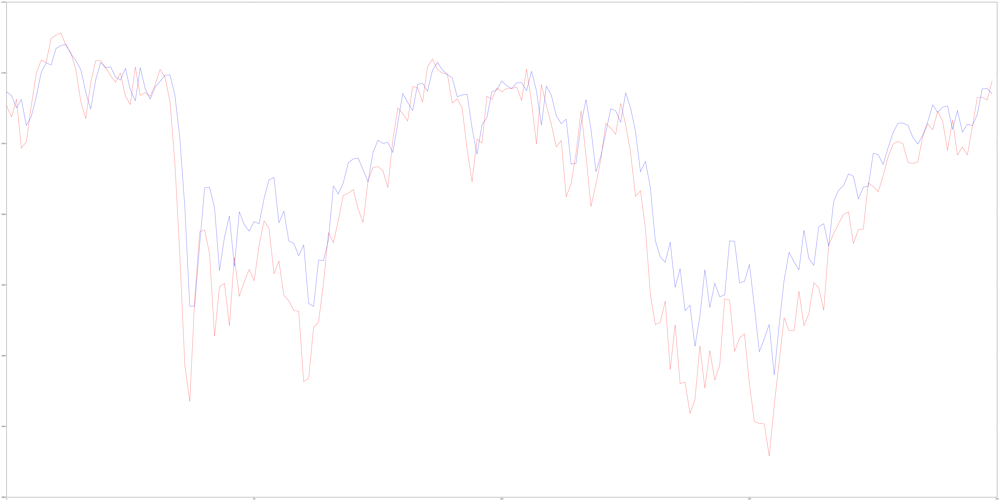

mean of test_RMSE
61.6552044717
std of test_RMSE
13.2119041962
mean of test_r2Score
0.820355348957
std of test_r2Score
0.0819956217899
mean of accuracy_all
0.542610220174
std of accuracy_all
0.0108259015179
mean of accuracy_30
0.632258064516
std of accuracy_30
0.0328969000877


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


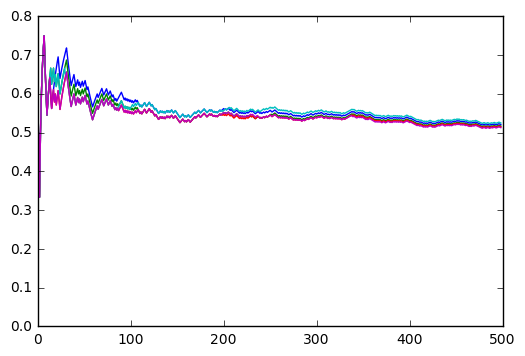

adjclose plot


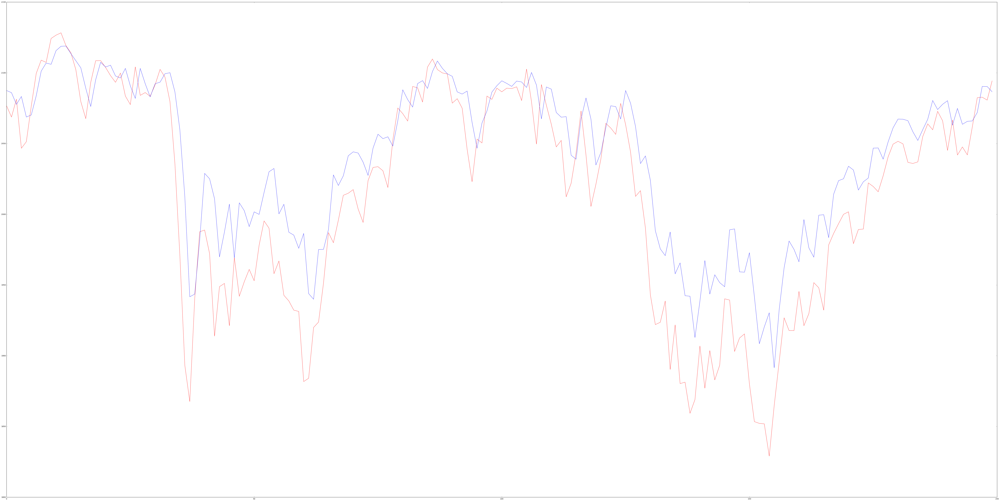

mean of test_RMSE
58.5506144538
std of test_RMSE
2.79651675514
mean of test_r2Score
0.844750818725
std of test_r2Score
0.0150349636483
mean of accuracy_all
0.549138097978
std of accuracy_all
0.00652512206947
mean of accuracy_30
0.664516129032
std of accuracy_30
0.0258064516129


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


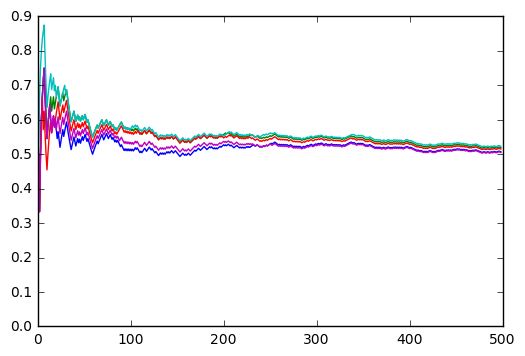

adjclose plot


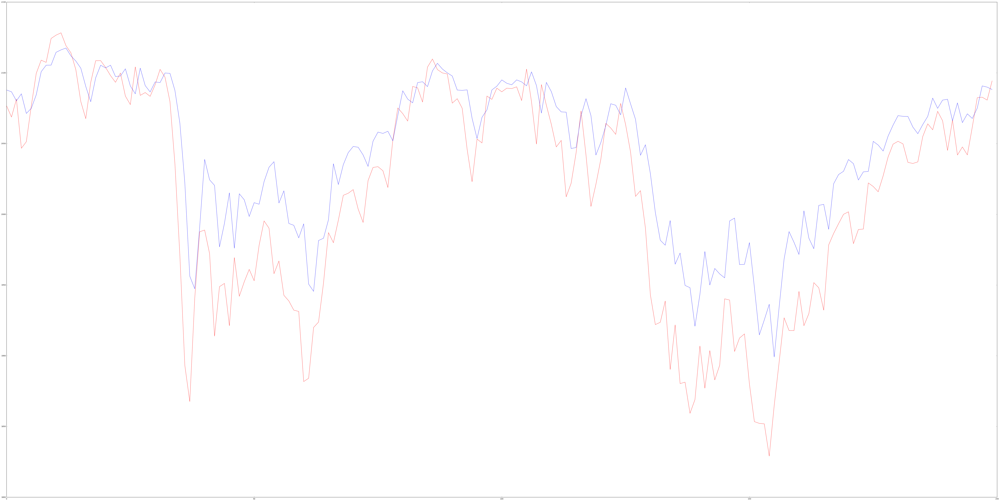

mean of test_RMSE
80.09870365
std of test_RMSE
16.3258744844
mean of test_r2Score
0.69807078192
std of test_r2Score
0.114822313107
mean of accuracy_all
0.542017040521
std of accuracy_all
0.014671646073
mean of accuracy_30
0.638709677419
std of accuracy_30
0.0376190444829


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


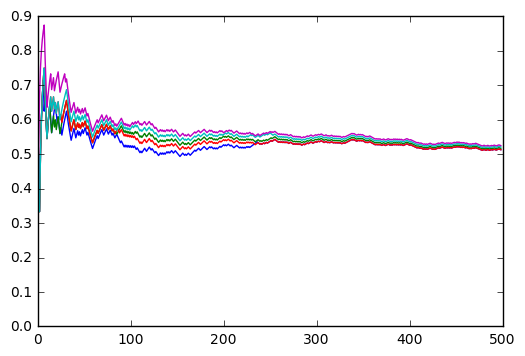

adjclose plot


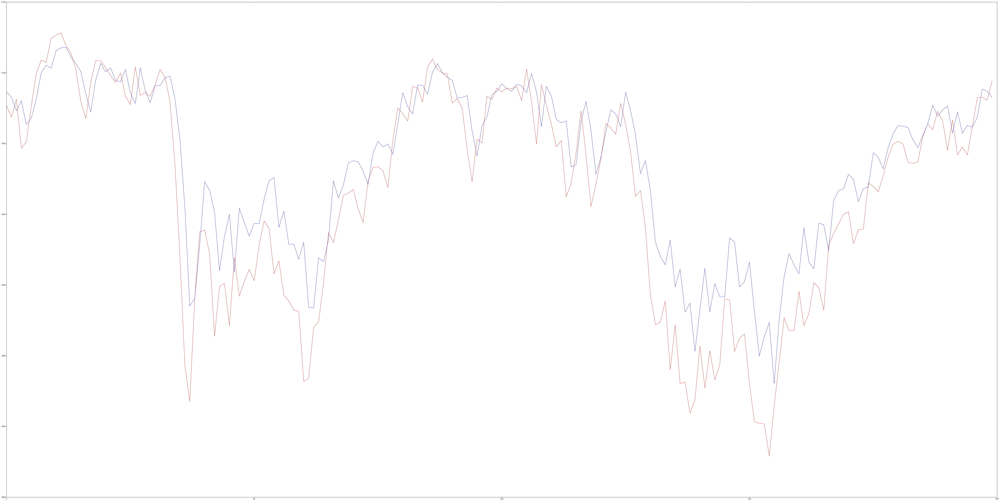

mean of test_RMSE
59.9704160839
std of test_RMSE
7.30981501592
mean of test_r2Score
0.835086622446
std of test_r2Score
0.0430653478253
mean of accuracy_all
0.547525918778
std of accuracy_all
0.0135854608479
mean of accuracy_30
0.658064516129
std of accuracy_30
0.0328969000877


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


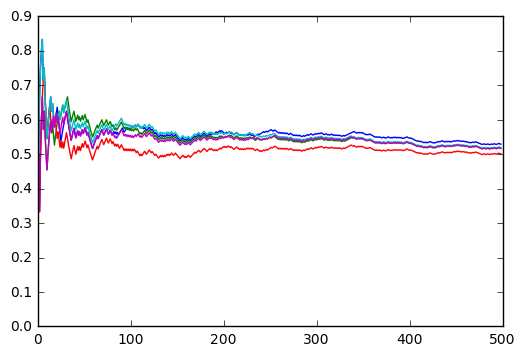

adjclose plot


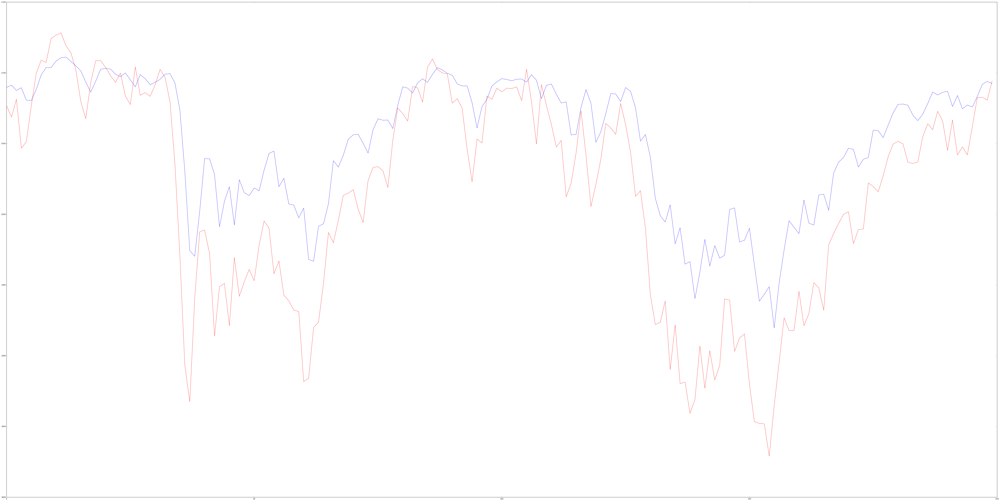

mean of test_RMSE
98.3108023007
std of test_RMSE
17.362424975
mean of test_r2Score
0.549683290755
std of test_r2Score
0.145492178463
mean of accuracy_all
0.542918564376
std of accuracy_all
0.0154728698543
mean of accuracy_30
0.612903225806
std of accuracy_30
0.0353369391939


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


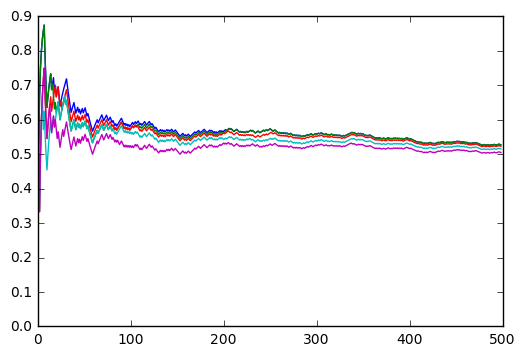

adjclose plot


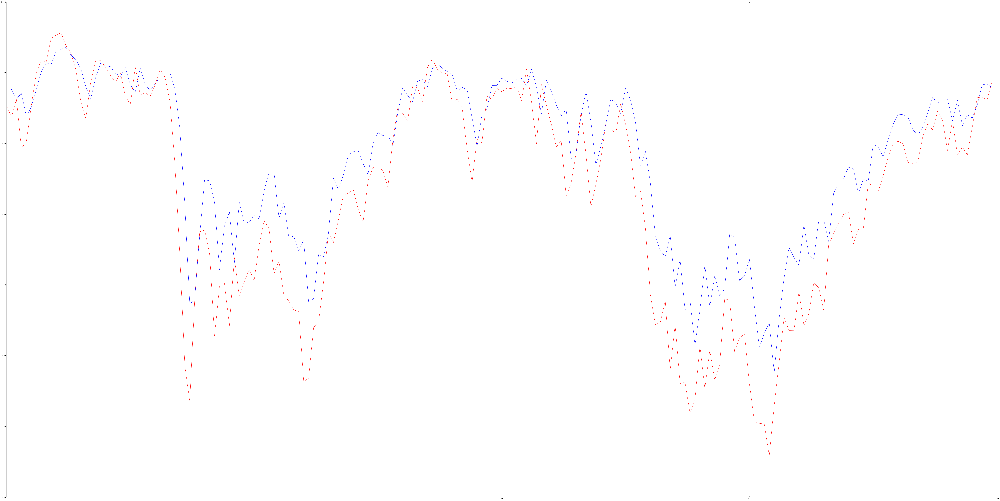

mean of test_RMSE
60.4694455993
std of test_RMSE
14.8976341632
mean of test_r2Score
0.824757333725
std of test_r2Score
0.0844809587356
mean of accuracy_all
0.551390985597
std of accuracy_all
0.0168295488595
mean of accuracy_30
0.651612903226
std of accuracy_30
0.0427951585852


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


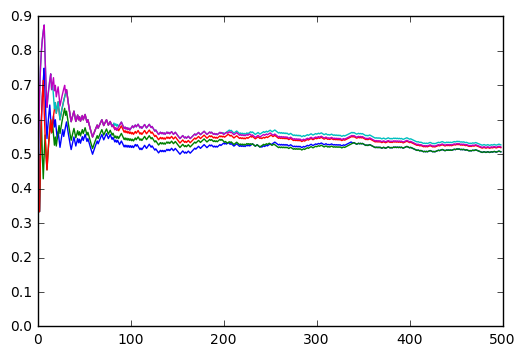

adjclose plot


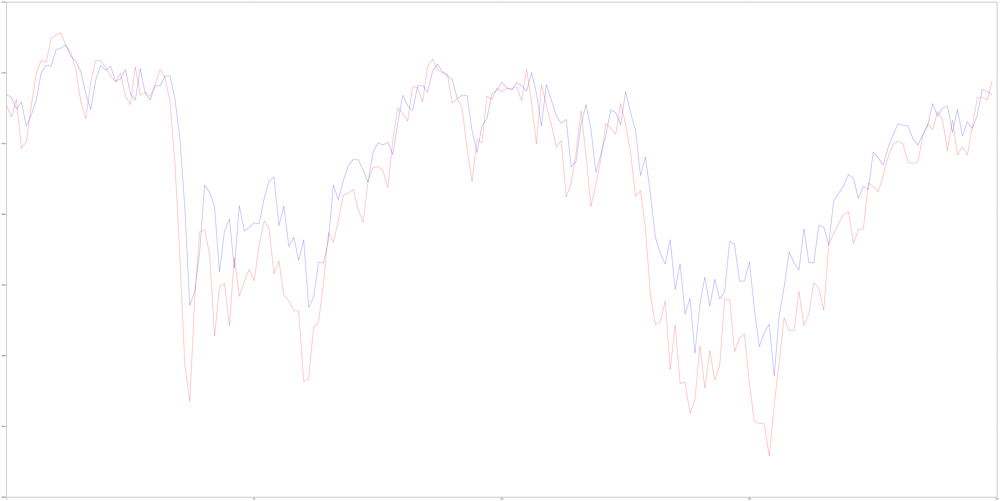

mean of test_RMSE
58.5916470756
std of test_RMSE
11.3438618693
mean of test_r2Score
0.839072677758
std of test_r2Score
0.0622492790787
mean of accuracy_all
0.545841748996
std of accuracy_all
0.016642278841
mean of accuracy_30
0.645161290323
std of accuracy_30
0.0408035827119


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:321: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:356: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)
C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a sing

accuracy plot


C:\Program Files\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:374: DeprecationWarning: Passing 1d arrays as data is deprecated in 0.17 and will raise ValueError in 0.19. Reshape your data either using X.reshape(-1, 1) if your data has a single feature or X.reshape(1, -1) if it contains a single sample.
  warnings.warn(DEPRECATION_MSG_1D, DeprecationWarning)


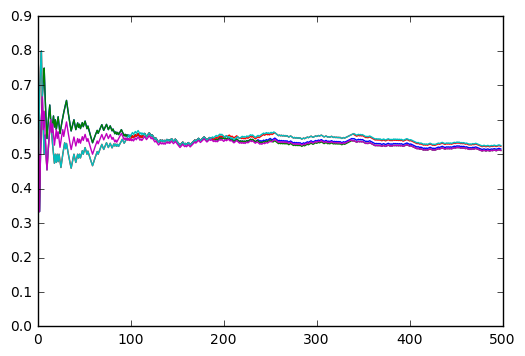

adjclose plot


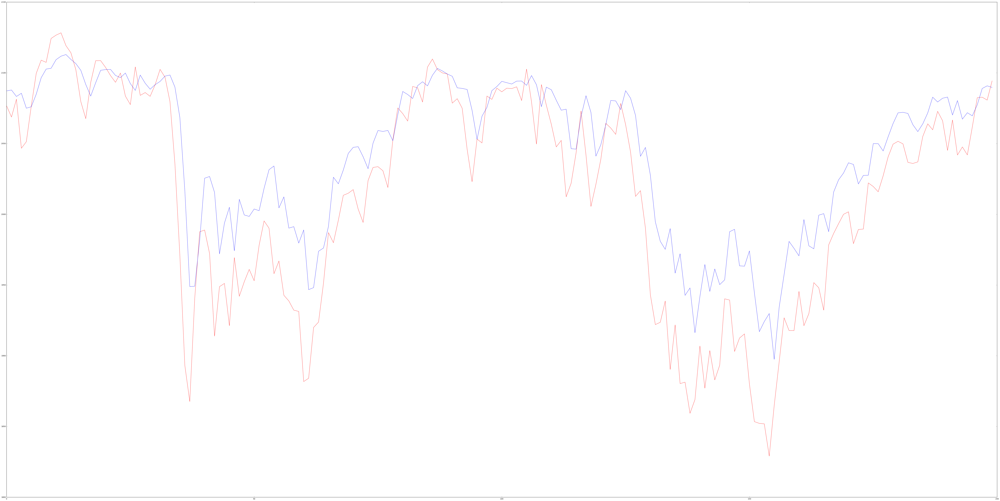

mean of test_RMSE
57.8185338171
std of test_RMSE
22.831661905
mean of test_r2Score
0.825400096851
std of test_r2Score
0.147729386823
mean of accuracy_all
0.53768178436
std of accuracy_all
0.00377497183973
mean of accuracy_30
0.58064516129
std of accuracy_30
0.0577049800645


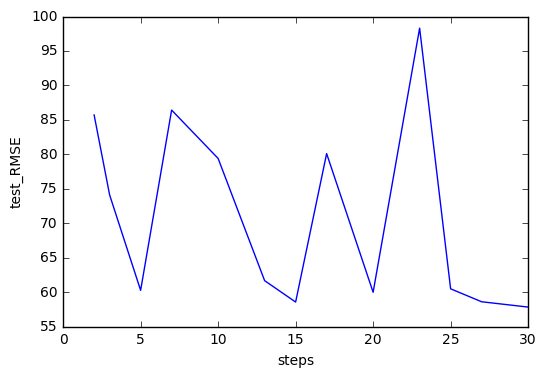

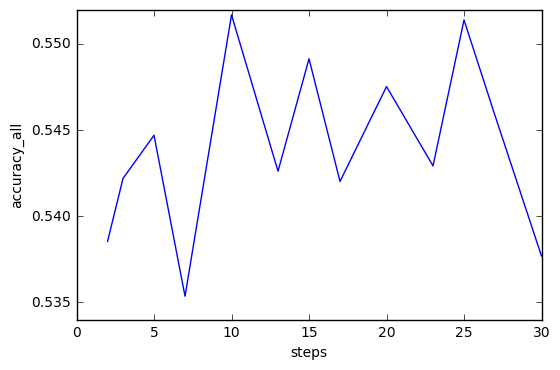

time cost
152118.54668331146


In [5]:
start = time.time()

test_RMSE_all=[]
accuracy_all_all=[]

for step in steps:
    
    test_RMSE=[]
    test_r2Score=[]
    accuracy_all=[]
    accuracy_30=[]
    for i in range(repeats):
        
        
        trainX,trainY,testX,testY,scaler_dataset,scaler_target=preparedata_steps(step)
        # create and fit the LSTM network
        model = Sequential()
        model.add(LSTM(4, batch_input_shape=(1, trainX.shape[1], trainX.shape[2]), stateful=True))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')
        for i in range(100):
            model.fit(trainX,trainY,epochs=1,batch_size=1,verbose=0,shuffle=False)
            model.reset_states()

        # make predictions
        testPredict = model.predict(testX, batch_size=1)
        # invert predictions
        testPredict =  scaler_target.inverse_transform(testPredict)
        testY =  scaler_target.inverse_transform(testY)
        # calculate root mean squared error and R2 score
        test_RMSE.append(math.sqrt(mean_squared_error(testY, testPredict)))
        test_r2Score.append(r2_score(testY, testPredict))
        #transfer to classification probelm
        test_true=testY[:]
        test_pred=testPredict[:]

        test_true_clssfi=[]
        for  i in range(1,len(test_true)):
            if test_true[i]>test_true[i-1]:
                test_true_clssfi.append(1)
            else:
                test_true_clssfi.append(0)

        test_pred_clssfi=[]
        for  i in range(1,len(test_pred)):
            if test_pred[i]>test_true[i-1]:
                test_pred_clssfi.append(1)
            else:
                test_pred_clssfi.append(0)

        accuracy=[]
        for i in range(1,len(test_pred_clssfi)+1):
            accuracy.append(accuracy_score(test_true_clssfi[0:i],test_pred_clssfi[0:i]))
        plt.plot(accuracy)
        accuracy_all.append(np.mean(accuracy))
        accuracy_30.append(np.mean(accuracy[30]))

    print('accuracy plot')    
    plt.show()

    print('adjclose plot')  
    test_true=testY[:200]
    test_pred=testPredict[:200]

    fig, ax = plt.subplots(figsize=(100, 50))
    plt.plot(test_true,color='red')
    plt.plot(test_pred,color='blue')
    plt.show()

    print('mean of test_RMSE')
    print(np.mean(test_RMSE))

    print('std of test_RMSE')
    print(np.std(test_RMSE))

    print('mean of test_r2Score')
    print(np.mean(test_r2Score))

    print('std of test_r2Score')
    print(np.std(test_r2Score))

    print('mean of accuracy_all')
    print(np.mean(accuracy_all))

    print('std of accuracy_all')
    print(np.std(accuracy_all))

    print('mean of accuracy_30')
    print(np.mean(accuracy_30))

    print('std of accuracy_30')
    print(np.std(accuracy_30))

    test_RMSE_all.append(np.mean(test_RMSE))
    accuracy_all_all.append(np.mean(accuracy_all))
  
    

plt.plot(steps,test_RMSE_all)
plt.xlabel('steps')
plt.ylabel('test_RMSE')
plt.show()

plt.plot(steps,accuracy_all_all)
plt.xlabel('steps')
plt.ylabel('accuracy_all')
plt.show()


print('time cost')
print( time.time() - start)  